In [1]:
ls

drive/  sample_data/


In [2]:
%cd /content/drive/MyDrive/Manish Sir Project/Face_dataset/

/content/drive/MyDrive/Manish Sir Project/Face_dataset


In [3]:
ls

'Copy of facenet_keras_weights.h5'   model.png
 Encodings/                          Test/
 face_encoder_train.png              Testing_masked/
 Facenet_1.ipynb                     Testing_Unmasked/
 Facenet_2.ipynb                     Train/
 facenet_keras.h5                    Train_Data.npz
 Faces.ipynb                         Training/
 featureExtractor.png                Val/
'Implementing Facenet.ipynb'         Val_Data.npz
 Masked_Data.npz


In [4]:
!pip install livelossplot

In [5]:
import os
import sys
import pickle
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cosine
from keras.models import load_model
import cv2
from sklearn.preprocessing import Normalizer, LabelEncoder

## Utility Functions



In [6]:
def get_encodings(encoder_model, face, size):
  face = normalise(face)
  face = cv2.resize(face, size)
  encode = encoder_model.predict(np.expand_dims(face, axis = 0))[0]
  return encode

In [7]:
l2_norm = Normalizer('l2')

In [8]:
def normalise(image):
  mean = image.mean()
  std = image.std()
  norm = (image - mean) / std

  return norm

In [9]:
def show_image(image):
  img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  plt.imshow(img_rgb)
  plt.show()

In [10]:
def save_pkl(path):
  with open(path, 'wb') as file:
    pickle.dump(obj, file)

In [11]:
def load_pkl(path, obj):
  with open(path, 'rb') as file:
    encoding_dict = pickle.load(f)
  return encoding_dict  

In [12]:
def generate_triplets():
  while True:
    anchor_batch = np.random.rand(4, 96, 96, 3)
    positive_batch = np.random.rand(4, 96, 96, 3)
    negative_batch = np.random.rand(4, 96, 96, 3)
    yield [anchor_batch, positive_batch, negative_batch], None
    

In [13]:
def distance(emb1, emb2):
    return np.sum(np.square(emb1 - emb2))

In [14]:
required_size = (160, 160)
encoding_dict = dict()

In [15]:
def load_image(path):
    img = cv2.imread(path, 1)
    img = cv2.resize(img, required_size)
    return img[...,::-1]

In [16]:
encoder_model = '/content/drive/MyDrive/Manish Sir Project/Face_dataset/facenet_keras.h5'
train_directory = '/content/drive/MyDrive/Manish Sir Project/Face_dataset/Training'
encoding_directory = '/content/drive/MyDrive/Manish Sir Project/Face_dataset/Encodings'

## Defining Models

In [17]:
face_encoder = load_model(encoder_model, compile = True)
face_encoder.summary()

Model: "inception_resnet_v1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
Conv2d_1a_3x3 (Conv2D)          (None, 79, 79, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
Conv2d_1a_3x3_BatchNorm (BatchN (None, 79, 79, 32)   96          Conv2d_1a_3x3[0][0]              
__________________________________________________________________________________________________
Conv2d_1a_3x3_Activation (Activ (None, 79, 79, 32)   0           Conv2d_1a_3x3_BatchNorm[0][0]    
________________________________________________________________________________

In [18]:
from keras.utils.vis_utils import plot_model
plot_model(face_encoder, show_shapes=True, show_layer_names=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.937996 to fit
tcmalloc: large alloc 1655128064 bytes == 0x556f54ed4000 @  0x7f72c7229001 0x7f72c34c01fa 0x7f72c34c02ad 0x7f72c464b6df 0x7f72c4b42261 0x7f72c6fbf468 0x7f72c6fc1d53 0x556f523ee092 0x7f72c6974bf7 0x556f523ee12a



In [19]:
from keras import backend as K
from keras.models import Model
from keras.layers import Input, Layer
from livelossplot import PlotLossesKeras

In [20]:
# Input for anchor, positive and negative images
inp_anchor = Input(shape=(160, 160, 3))
inp_positive = Input(shape=(160, 160, 3))
inp_negative = Input(shape=(160, 160, 3))

In [21]:
# Output for anchor, positive and negative embedding vectors
# The nn4_small model instance is shared (Siamese network)
emb_anchor = face_encoder(inp_anchor)
emb_positive = face_encoder(inp_positive)
emb_negative = face_encoder(inp_negative)


In [22]:
class TripletLossLayer(Layer):
    def __init__(self, alpha, **kwargs):
        self.alpha = alpha
        super(TripletLossLayer, self).__init__(**kwargs)
    
    def triplet_loss(self, inputs):
        a, p, n = inputs
        p_dist = K.sum(K.square(a-p), axis=-1)
        n_dist = K.sum(K.square(a-n), axis=-1)
        return K.sum(K.maximum(p_dist - n_dist + self.alpha, 0), axis=0)
    
    def call(self, inputs):
        loss = self.triplet_loss(inputs)
        self.add_loss(loss)
        return loss

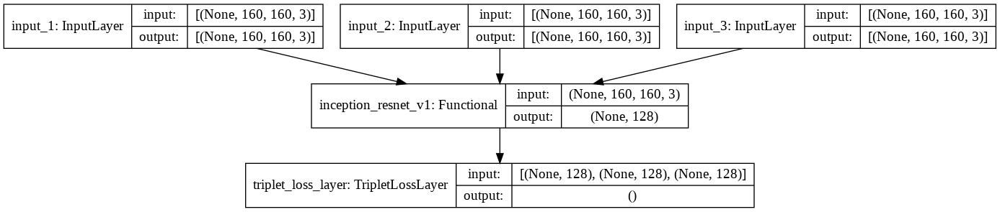

In [23]:
# Layer that computes the triplet loss from anchor, positive and negative embedding vectors
triplet_loss_layer = TripletLossLayer(alpha=0.2, name='triplet_loss_layer')([emb_anchor, emb_positive, emb_negative])

# Model that can be trained with anchor, positive negative images
face_encoder_train = Model([inp_anchor, inp_positive, inp_negative], triplet_loss_layer)
plot_model(face_encoder_train, to_file='face_encoder_train.png', show_shapes=True, show_layer_names=True)


In [24]:
def triplet_generator():
    while True:
        a_batch = np.random.rand(4, 160, 160, 3)
        p_batch = np.random.rand(4, 160, 160, 3)
        n_batch = np.random.rand(4, 160, 160, 3)
        yield [a_batch , p_batch, n_batch], None

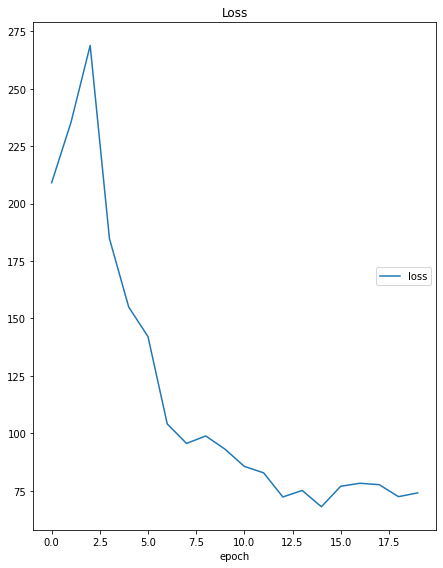

Loss
	loss             	 (min:   68.030, max:  268.887, cur:   74.061)


In [25]:
generator = triplet_generator() 

face_encoder_train.compile(loss=None, optimizer='adam')
face_encoder_train.fit_generator(generator, epochs=20, steps_per_epoch=150, callbacks = [PlotLossesKeras()])

In [26]:
import os.path
import numpy as np

class IdentityMetadata():
    def __init__(self, base, name, file):
        # dataset base directory
        self.base = base
        # identity name
        self.name = name
        # image file name
        self.file = file

    def __repr__(self):
        return self.image_path()

    def image_path(self):
        return os.path.join(self.base, self.name, self.file) 

In [27]:
def load_metadata(path):
    metadata = []
    for i in os.listdir(path):
        #print(i)
        for f in os.listdir(os.path.join(path, i)):
            # Check file extension. Allow only jpg/jpeg' files.
            #print(os.path.splitext(f)[0])
            #ext = os.path.splitext(f)[1]
            #if ext == 'jpg' or ext == 'jpeg':
            #print(ext)
            metadata.append(IdentityMetadata(path, i, f))
    return np.array(metadata)

In [28]:
train_metadata = load_metadata("Training")
test_metadata = load_metadata("Testing_Unmasked")
mask_metadata = load_metadata("Testing_masked")

## Generate Embedding Vectors

In [29]:
from progressbar import ProgressBar

In [31]:
num_images = train_metadata.shape[0]
progress = ProgressBar(num_images)
progress.start()

train_embedded = np.zeros((num_images, 128))

for i, m in enumerate(train_metadata):
    #print(m.image_path())    
    img = load_image(m.image_path())
    # scale RGB values to interval [0,1]
    img = (img / 255.).astype(np.float32)
    # obtain embedding vector for image
    embedded[i] = face_encoder.predict(np.expand_dims(img, axis=0))[0]
    progress.update(i)

- |     #                                          | 1449 Elapsed Time: 0:05:36

In [32]:
num_images = mask_metadata.shape[0]
progress = ProgressBar(num_images)
progress.start()

mask_embedded = np.zeros((num_images, 128))

for i, m in enumerate(mask_metadata):
    #print(m.image_path())    
    img = load_image(m.image_path())
    # scale RGB values to interval [0,1]
    img = (img / 255.).astype(np.float32)
    # obtain embedding vector for image
    mask_embedded[i] = face_encoder.predict(np.expand_dims(img, axis=0))[0]
    progress.update(i)

\ |                #                                | 329 Elapsed Time: 0:01:29

In [34]:
num_images = test_metadata.shape[0]
progress = ProgressBar(num_images)
progress.start()

test_embedded = np.zeros((num_images, 128))

for i, m in enumerate(test_metadata):
    #print(m.image_path())    
    img = load_image(m.image_path())
    # scale RGB values to interval [0,1]
    img = (img / 255.).astype(np.float32)
    # obtain embedding vector for image
    test_embedded[i] = face_encoder.predict(np.expand_dims(img, axis=0))[0]
    progress.update(i)

| |      #                                          | 550 Elapsed Time: 0:02:27

In [35]:
def show_pair(idx1, idx2):
    plt.figure(figsize=(10,5))
    plt.suptitle(f'Distance = {distance(embedded[idx1], embedded[idx2]):.2f}')
    plt.subplot(121)
    plt.imshow(load_image(train_metadata[idx1].image_path()))
    plt.subplot(122)
    plt.imshow(load_image(train_metadata[idx2].image_path()));

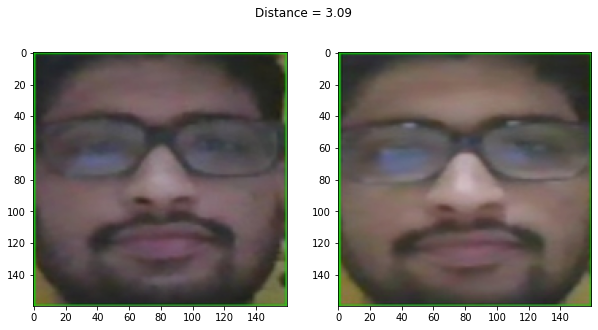

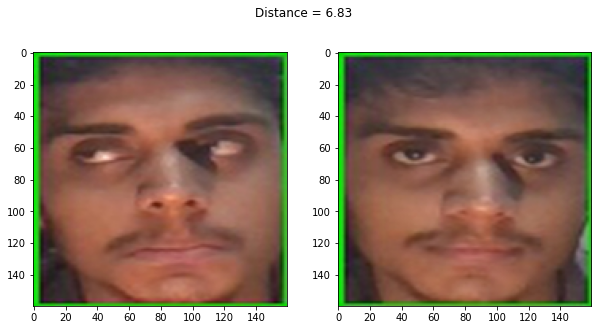

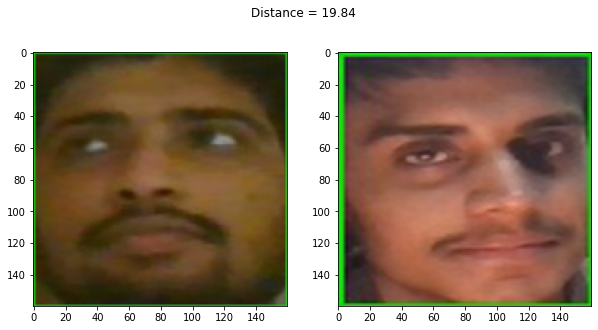

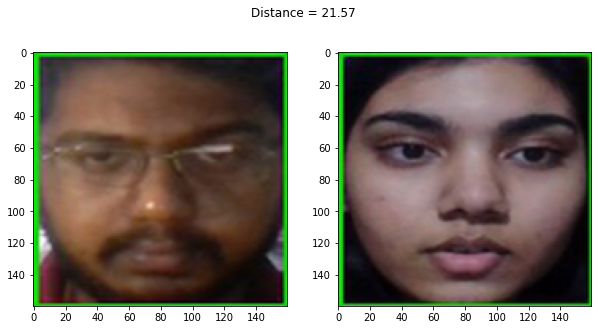

In [36]:
'''Aayush vs Aayush'''
show_pair(157, 160)
'''Rudra vs Rudra'''
show_pair(600, 700)
'''Aayush vs Rudra'''
show_pair(20, 420)
'''Ashish vs Komal'''
show_pair(900, 1200)

In [37]:
def show_dif_pair(idx1, idx2):
    plt.figure(figsize=(10,5))
    plt.suptitle(f'Distance = {distance(embedded[idx1], mask_embedded[idx2]):.2f}')
    plt.subplot(121)
    plt.imshow(load_image(train_metadata[idx1].image_path()))
    plt.subplot(122)
    plt.imshow(load_image(mask_metadata[idx2].image_path()));

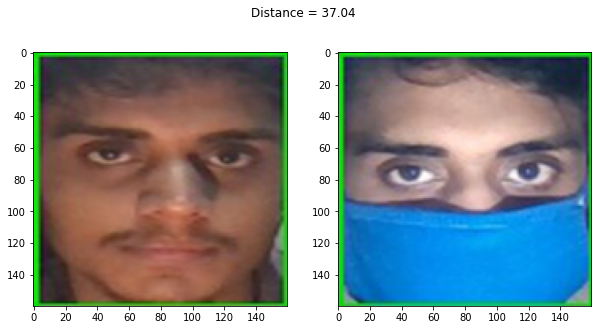

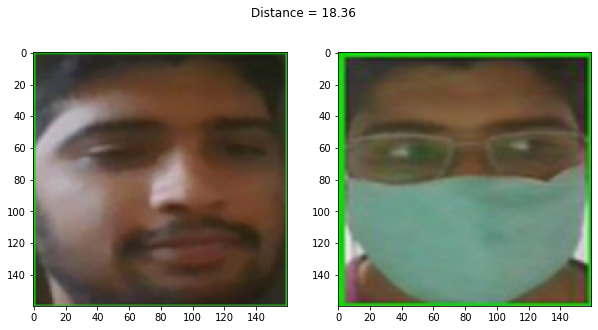

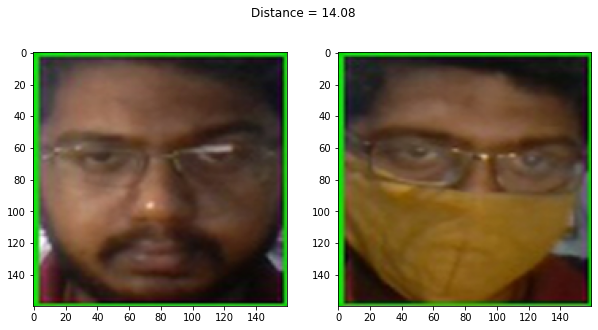

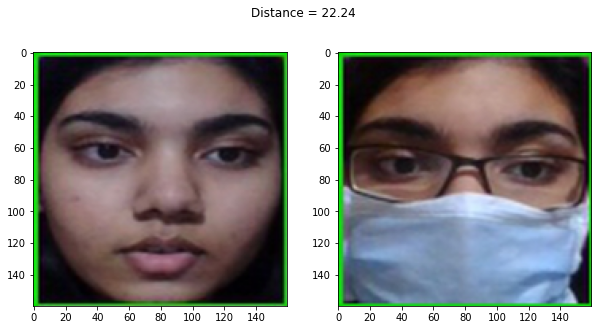

In [38]:
"""Aayush vs Aayush Masked"""
show_dif_pair(700, 0)
show_dif_pair(100, 130)
show_dif_pair(900, 300)
show_dif_pair(1200, 250)

## Finding the Distance threshold for Unmasked 

In [39]:
from sklearn.metrics import f1_score, accuracy_score

In [40]:
num = len(train_metadata)

distances = [] # squared L2 distance between pairs
identical = [] # 1 if same identity, 0 otherwise

for i in range(num):
    for j in range(num):
        distances.append(distance(embedded[i], embedded[j]))
        identical.append(1 if train_metadata[i].name == train_metadata[j].name else 0)
        
distances = np.array(distances)
identical = np.array(identical)


In [41]:
thresholds = np.arange(min(distances), 100,  5)

f1_scores = [f1_score(identical, distances < t) for t in thresholds]
acc_scores = [accuracy_score(identical, distances < t) for t in thresholds]

In [42]:
opt_idx = np.argmax(f1_scores)
# Threshold at maximal F1 score
opt_tau = thresholds[opt_idx]
# Accuracy at maximal F1 score
opt_acc = accuracy_score(identical, distances < opt_tau)

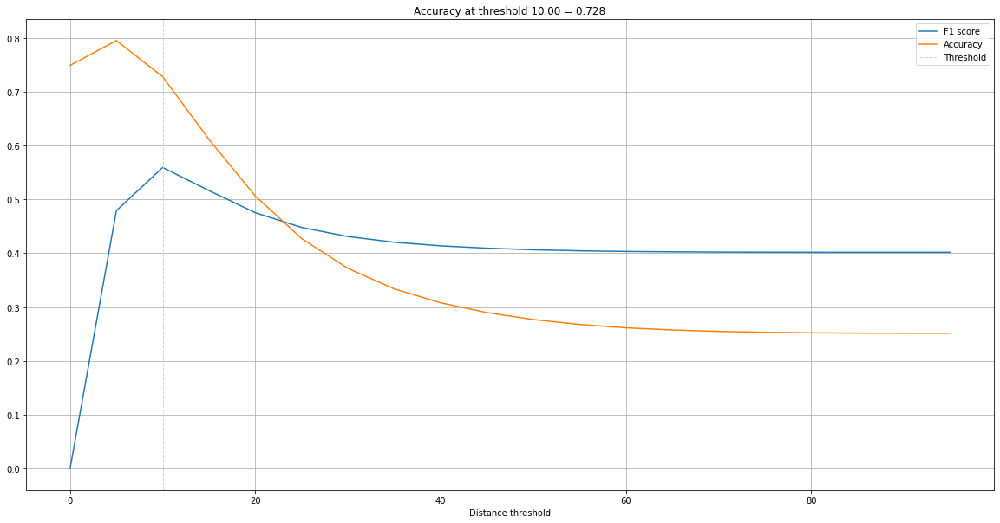

In [43]:
# Plot F1 score and accuracy as function of distance threshold
plt.figure(figsize = (20, 10))
plt.plot(thresholds, f1_scores, label='F1 score');
plt.plot(thresholds, acc_scores, label='Accuracy');
plt.axvline(x=opt_tau, linestyle='--', lw=1, c='lightgrey', label='Threshold')
plt.title(f'Accuracy at threshold {opt_tau:.2f} = {opt_acc:.3f}');
plt.xlabel('Distance threshold')
plt.grid()
plt.legend();

In [44]:
import seaborn as sns

<Figure size 720x720 with 0 Axes>

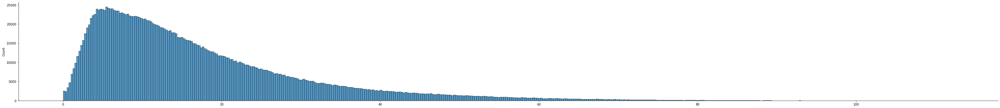

In [71]:
plt.figure(figsize = (10, 10))
sns.displot(data = distances, aspect = 9 )
plt.show();

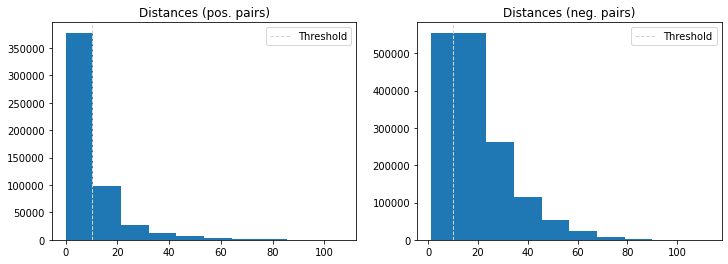

In [46]:
dist_pos = distances[identical == 1]
dist_neg = distances[identical == 0]

plt.figure(figsize=(12,4))

plt.subplot(121)
plt.hist(dist_pos)
plt.axvline(x=opt_tau, linestyle='--', lw=1, c='lightgrey', label='Threshold')
plt.title('Distances (pos. pairs)')
plt.legend();

plt.subplot(122)
plt.hist(dist_neg)
plt.axvline(x=opt_tau, linestyle='--', lw=1, c='lightgrey', label='Threshold')
plt.title('Distances (neg. pairs)')
plt.legend();

## Testing with masked and unmasked set

In [55]:
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC

In [57]:
train_labels = np.array([m.name for m in train_metadata])
unmasked_labels = np.array([m.name for m in test_metadata])
masked_labels = np.array([m.name for m in mask_metadata])

train_encoder = LabelEncoder()
unmasked_encoder = LabelEncoder()
masked_encoder = LabelEncoder()

train_encoder.fit(train_labels)
unmasked_encoder.fit(unmasked_labels)
masked_encoder.fit(masked_labels)

y_train = input_encoder.transform(train_labels)
y_unmasked = unmasked_encoder.transform(unmasked_labels)
y_masked = masked_encoder.transform(masked_labels)

unmasked_idx = np.arange(test_metadata.shape[0])
train_idx = np.arange(train_metadata.shape[0])
masked_idx = np.arange(mask_metadata.shape[0])

X_train = embedded[train_idx]
X_unmasked = test_embedded[unmasked_idx]
X_mask = mask_embedded[masked_idx]

y_train = y_train[train_idx]
y_unmasked = y_unmasked[unmasked_idx]
y_masked = y_masked[masked_idx]

In [58]:
knn = KNeighborsClassifier(n_neighbors=1, metric='euclidean')
svc = LinearSVC()

knn.fit(X_train, y_train)
svc.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

In [68]:
y_pred_knn_unmasked = knn.predict(X_unmasked)
acc_knn_unmasked = accuracy_score(y_unmasked, y_pred_knn_unmasked)

y_pred_svc_unmasked = svc.predict(X_unmasked)
acc_svc_unmasked = accuracy_score(y_unmasked, y_pred_svc_unmasked)


y_pred_knn_masked = knn.predict(X_mask)
acc_knn_masked = accuracy_score(y_masked, y_pred_knn_masked)

y_pred_svc_masked = svc.predict(X_mask)
acc_svc_masked = accuracy_score(y_masked, y_pred_svc_masked)

In [65]:
print(f'KNN accuracy on Unmasked = {acc_knn_unmasked*100}')
print(f'KNN accuracy on masked = {acc_knn_masked*100}')
print(f"KNN Accuracy Drop = {acc_knn_unmasked*100 - acc_knn_masked*100}")

KNN accuracy on Unmasked = 89.11070780399274
KNN accuracy on masked = 35.75757575757576
KNN Accuracy Drop = 53.35313204641698


In [67]:
print(f'SVM accuracy on Unmasked = {acc_svc_unmasked*100}')
print(f'SVM accuracy on masked = {acc_knn_masked*100}')
print(f"SVM Accuracy Drop = {acc_svc_unmasked*100 - acc_svc_masked*100}")

SVM accuracy on Unmasked = 98.72958257713249
SVM accuracy on masked = 35.75757575757576
SVM Accuracy Drop = 59.032612880162795
